### Importação dos dados



In [35]:
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Markdown, display
import folium

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


# Análise de Dados

##1.💰Faturamento Total das Lojas

Nesta etapa, criamos um DataFrame com o faturamento total de cada loja da Alura Store, somando os valores da coluna "Preço" de cada base de dados.
  
Em seguida, exibimos o resultado com formatação monetária no padrão brasileiro (R$ com vírgula como separador decimal).


In [23]:
# Calcula o total de venda por cada loja
faturamento_1 = loja['Preço'].sum()
faturamento_2 = loja2['Preço'].sum()
faturamento_3 = loja3['Preço'].sum()
faturamento_4 = loja4['Preço'].sum()

# Criação do DataFrame com faturamento por loja
faturamentos = pd.DataFrame({
    'Loja': ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4'],
    'Faturamento': [faturamento_1, faturamento_2, faturamento_3, faturamento_4]
})

# Exibe os valores formatados (texto) no padrão brasileiro
for index, row in faturamentos.iterrows():
    valor_formatado = f"{row['Faturamento']:,.2f}".replace(",", "X").replace(".", ",").replace("X", ".")
    print(f"Faturamento da {row['Loja']}: R$ {valor_formatado}")

Faturamento da Loja 1: R$ 1.534.509,12
Faturamento da Loja 2: R$ 1.488.459,06
Faturamento da Loja 3: R$ 1.464.025,03
Faturamento da Loja 4: R$ 1.384.497,58


## 2.📦Vendas por Categoria por Loja

Nesta etapa, analisamos a quantidade de produtos vendidos por categoria em cada uma das quatro lojas da Alura Store.

Foi criada uma função chamada `gerar_df_categoria()` que recebe o DataFrame de uma loja e retorna um novo DataFrame com a contagem de vendas por categoria.

Em seguida, utilizamos `display()` e `Markdown` para apresentar os resultados de forma clara e visualmente agradável.


In [24]:
# Função que gera um DataFrame com a contagem de vendas por categoria
def gerar_df_categoria(df, nome_loja):

    # Conta quantos produtos foram vendidos por categoria
    categorias = df['Categoria do Produto'].value_counts().reset_index()

    # Renomeia as colunas para melhor entendimento
    categorias.columns = ['Categoria', 'Quantidade']
    categorias['Loja'] = nome_loja
    return categorias

# Geração dos DataFrames de categorias por loja
categorias_1_df = gerar_df_categoria(loja, "Loja 1")
categorias_2_df = gerar_df_categoria(loja2, "Loja 2")
categorias_3_df = gerar_df_categoria(loja3, "Loja 3")
categorias_4_df = gerar_df_categoria(loja4, "Loja 4")

# Exibição das lojas com títulos formatados
display(Markdown("##  Loja 1"))
display(categorias_1_df)

display(Markdown("##  Loja 2"))
display(categorias_2_df)

display(Markdown("##  Loja 3"))
display(categorias_3_df)

display(Markdown("##  Loja 4"))
display(categorias_4_df)

##  Loja 1

,Categoria,Quantidade,Loja
0,moveis,465,Loja 1
1,eletronicos,448,Loja 1
2,brinquedos,324,Loja 1
3,eletrodomesticos,312,Loja 1
4,esporte e lazer,284,Loja 1
5,instrumentos musicais,182,Loja 1
6,livros,173,Loja 1
7,utilidades domesticas,171,Loja 1


##  Loja 2

,Categoria,Quantidade,Loja
0,moveis,442,Loja 2
1,eletronicos,422,Loja 2
2,brinquedos,313,Loja 2
3,eletrodomesticos,305,Loja 2
4,esporte e lazer,275,Loja 2
5,instrumentos musicais,224,Loja 2
6,livros,197,Loja 2
7,utilidades domesticas,181,Loja 2


##  Loja 3

,Categoria,Quantidade,Loja
0,moveis,499,Loja 3
1,eletronicos,451,Loja 3
2,brinquedos,315,Loja 3
3,eletrodomesticos,278,Loja 3
4,esporte e lazer,277,Loja 3
5,livros,185,Loja 3
6,instrumentos musicais,177,Loja 3
7,utilidades domesticas,177,Loja 3


##  Loja 4

,Categoria,Quantidade,Loja
0,moveis,480,Loja 4
1,eletronicos,451,Loja 4
2,brinquedos,338,Loja 4
3,esporte e lazer,277,Loja 4
4,eletrodomesticos,254,Loja 4
5,utilidades domesticas,201,Loja 4
6,livros,187,Loja 4
7,instrumentos musicais,170,Loja 4


## 3.⭐Média de Avaliação das Lojas

Agora vamos calcular a média das avaliações dadas pelos clientes para cada loja da Alura Store.
  
Essas avaliações refletem a satisfação dos consumidores e são um indicativo importante da qualidade do serviço oferecido em cada unidade.

In [25]:
# Calcula a média de avaliação por loja
avaliacoes = {
    'Loja 1': loja['Avaliação da compra'].mean(),
    'Loja 2': loja2['Avaliação da compra'].mean(),
    'Loja 3': loja3['Avaliação da compra'].mean(),
    'Loja 4': loja4['Avaliação da compra'].mean()
}

# Constrói o DataFrame com os resultados formatados
avaliacoes_df = pd.DataFrame(
    list(avaliacoes.items()),
    columns=['Loja', 'Média de Avaliação']
)

# Exibe as médias com duas casas decimais
avaliacoes_df['Média de Avaliação'] = avaliacoes_df['Média de Avaliação'].round(2)
display(avaliacoes_df)

,Loja,Média de Avaliação
0,Loja 1,3.98
1,Loja 2,4.04
2,Loja 3,4.05
3,Loja 4,4.00


## 4.🎯Produtos Mais e Menos Vendidos das Loja
Nesta etapa, analisamos quais são os produtos com maior e menor volume de vendas em cada loja da Alura Store.

Essa informação é essencial para entender o perfil de consumo dos clientes, ajustar o estoque e tomar decisões sobre promoções ou descontinuação de itens.

A função `exibir_top_bottom()` exibe os 5 produtos mais vendidos e os 5 menos vendidos de forma separada para cada loja.

In [26]:
# Define uma função para exibir os produtos mais e menos vendidos de uma loja
def exibir_top_bottom(df, nome_loja):

    # Conta quantas vezes cada produto aparece na coluna 'Produto'
    produtos = df['Produto'].value_counts()

    # Exibe o titulo da loja + top 5 produtos mais vendidos
    display(Markdown(f"##  {nome_loja} - Top 5 Produtos Mais Vendidos"))
    print(produtos.head().to_string())

    # Exibe o titulo da loja + 5 produtos menos vendidos
    display(Markdown(f"##  {nome_loja} - 5 Produtos Menos Vendidos"))
    print(produtos.tail().to_string())

exibir_top_bottom(loja, "Loja 1")
exibir_top_bottom(loja2, "Loja 2")
exibir_top_bottom(loja3, "Loja 3")
exibir_top_bottom(loja4, "Loja 4")

##  Loja 1 - Top 5 Produtos Mais Vendidos

Produto
Micro-ondas           60
TV Led UHD 4K         60
Guarda roupas         60
Secadora de roupas    58
Cômoda                56


##  Loja 1 - 5 Produtos Menos Vendidos

Produto
Ciência de dados com python    39
Pandeiro                       36
Panela de pressão              35
Headset                        33
Celular ABXY                   33


##  Loja 2 - Top 5 Produtos Mais Vendidos

Produto
Iniciando em programação    65
Micro-ondas                 62
Bateria                     61
Violão                      58
Pandeiro                    58


##  Loja 2 - 5 Produtos Menos Vendidos

Produto
Fone de ouvido       37
Poltrona             35
Mesa de jantar       34
Impressora           34
Jogo de tabuleiro    32


##  Loja 3 - Top 5 Produtos Mais Vendidos

Produto
Kit banquetas      57
Mesa de jantar     56
Cama king          56
Jogo de panelas    55
Cômoda             55


##  Loja 3 - 5 Produtos Menos Vendidos

Produto
Guitarra            38
Jogo de copos       36
Mochila             36
Micro-ondas         36
Blocos de montar    35


##  Loja 4 - Top 5 Produtos Mais Vendidos

Produto
Cama box                    62
Faqueiro                    59
Dashboards com Power BI     56
Cama king                   56
Carrinho controle remoto    55


##  Loja 4 - 5 Produtos Menos Vendidos

Produto
Geladeira                      38
Ciência de dados com python    38
Violão                         37
Guarda roupas                  34
Guitarra                       33


## 5.🚚Frete Médio por Loja
Aqui analisamos o custo médio de frete das quatro lojas da Alura Store.
  
O objetivo é entender qual loja tem os maiores e menores custos logísticos, o que pode impactar diretamente no lucro e na experiência do cliente.

Os valores foram formatados com duas casas decimais no padrão monetário brasileiro.

In [27]:
# Calcula o valor médio de frete para cada loja
frete_medio_1 = loja['Frete'].mean()
frete_medio_2 = loja2['Frete'].mean()
frete_medio_3 = loja3['Frete'].mean()
frete_medio_4 = loja4['Frete'].mean()

# Cria DataFrame com os resultados
fretes = pd.DataFrame({
    'Loja': ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4'],
    'Frete Médio': [frete_medio_1, frete_medio_2, frete_medio_3, frete_medio_4]
})

# Arredonda os valores e formata com símbolo de real
fretes['Frete Médio'] = fretes['Frete Médio'].round(2)
fretes['Frete Médio'] = fretes['Frete Médio'].map('R$ {:.2f}'.format)

# Exibe a tabela
from IPython.display import display
display(fretes)

,Loja,Frete Médio
0,Loja 1,R$ 34.69
1,Loja 2,R$ 33.62
2,Loja 3,R$ 33.07
3,Loja 4,R$ 31.28


# **Visualização de Resultados**

## **1.📊Faturamento Total por Loja - Gráfico em Barras**

O gráfico abaixo compara o total de vendas (faturamento bruto) das quatro lojas da Alura Store.

É possível observar que a **Loja 1 possui o maior faturamento**, enquanto a **Loja 4 apresenta o menor desempenho** nesse critério.

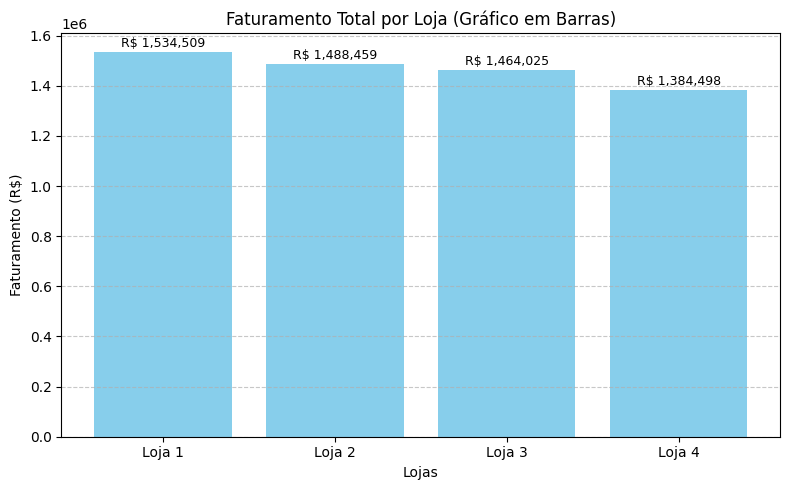

In [28]:
# Lista com os valores de faturamento por loja
faturamentos = [faturamento_1, faturamento_2, faturamento_3, faturamento_4]

# Nomes das lojas para o eixo X
lojas = ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4']

# Cria o gráfico de barras com as informações de faturamento
plt.figure(figsize=(8, 5))
plt.bar(lojas, faturamentos, color='skyblue')
plt.title('Faturamento Total por Loja (Gráfico em Barras)')
plt.ylabel('Faturamento (R$)')
plt.xlabel('Lojas')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adiciona os valores no topo das barras
for i, valor in enumerate(faturamentos):
    plt.text(i, valor + 20000, f'R$ {valor:,.0f}', ha='center', fontsize=9)

# Ajusta o layout e exibe o gráfico
plt.tight_layout()
plt.show()

## **2.📊Distribuição de Categorias - Barras Empilhadas**

In [29]:
# Contagem de categorias por loja
cat1 = loja['Categoria do Produto'].value_counts()
cat2 = loja2['Categoria do Produto'].value_counts()
cat3 = loja3['Categoria do Produto'].value_counts()
cat4 = loja4['Categoria do Produto'].value_counts()

# Cria um DataFrame com todas as categorias alinhadas
categorias_todas = pd.DataFrame({
    'Loja 1': cat1,
    'Loja 2': cat2,
    'Loja 3': cat3,
    'Loja 4': cat4
}).fillna(0)  # Preenche com 0 onde a loja não vendeu uma categoria

# Transpõe o DataFrame para ficar com lojas nas linhas e categorias nas colunas
categorias_todas = categorias_todas.T

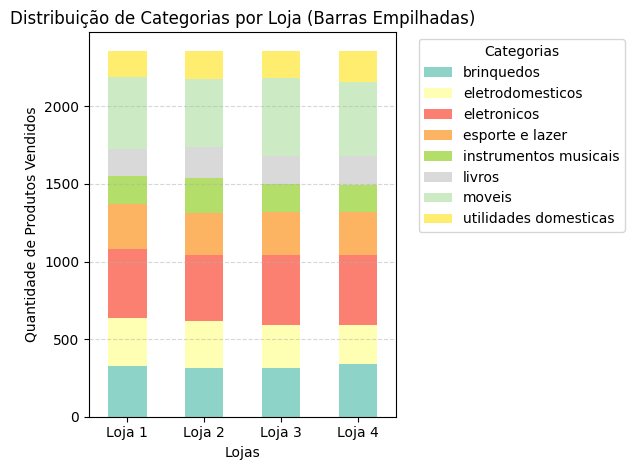

In [30]:
categorias_todas.plot(kind='bar', stacked=True, colormap='Set3')

plt.title('Distribuição de Categorias por Loja (Barras Empilhadas)')
plt.ylabel('Quantidade de Produtos Vendidos')
plt.xlabel('Lojas')
plt.xticks(rotation=0)
plt.legend(title='Categorias', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## **3.📊Avaliação Média por Mês - Gráfico de Linha**

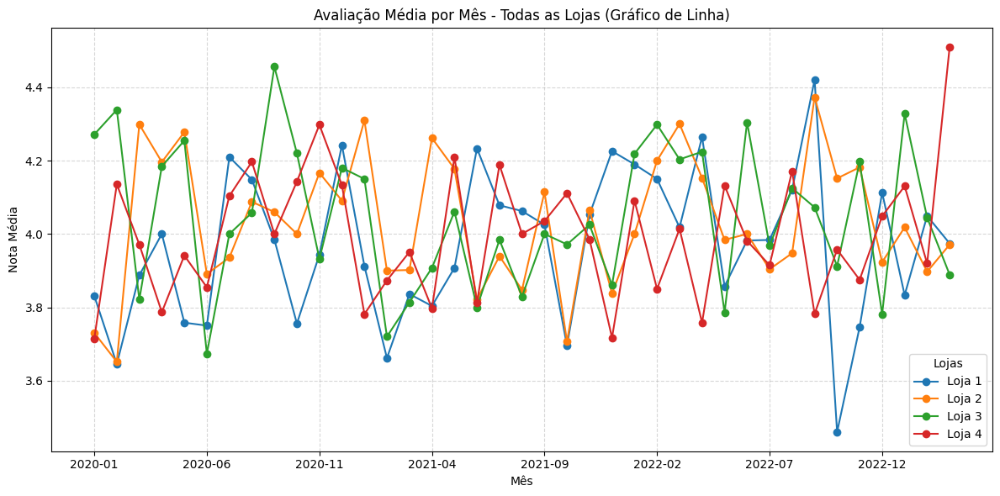

In [31]:
loja['Data da Compra'] = pd.to_datetime(loja['Data da Compra'], dayfirst=True)
loja2['Data da Compra'] = pd.to_datetime(loja2['Data da Compra'], dayfirst=True)
loja3['Data da Compra'] = pd.to_datetime(loja3['Data da Compra'], dayfirst=True)
loja4['Data da Compra'] = pd.to_datetime(loja4['Data da Compra'], dayfirst=True)

avaliacao_1 = loja.groupby(loja['Data da Compra'].dt.to_period('M'))['Avaliação da compra'].mean()
avaliacao_2 = loja2.groupby(loja2['Data da Compra'].dt.to_period('M'))['Avaliação da compra'].mean()
avaliacao_3 = loja3.groupby(loja3['Data da Compra'].dt.to_period('M'))['Avaliação da compra'].mean()
avaliacao_4 = loja4.groupby(loja4['Data da Compra'].dt.to_period('M'))['Avaliação da compra'].mean()

avaliacoes_df = pd.DataFrame({
    'Loja 1': avaliacao_1,
    'Loja 2': avaliacao_2,
    'Loja 3': avaliacao_3,
    'Loja 4': avaliacao_4
}).fillna(0)  # ou .fillna(method='ffill') se quiser manter a última nota em meses sem dado

# Plot
avaliacoes_df.index = avaliacoes_df.index.astype(str)  # transforma o index em string (pra eixo X ficar bonito)

avaliacoes_df.plot(kind='line', marker='o', figsize=(12, 6))
plt.title('Avaliação Média por Mês - Todas as Lojas (Gráfico de Linha)')
plt.xlabel('Mês')
plt.ylabel('Nota Média')
plt.legend(title='Lojas')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


# **Relatório Final**

## 📌 Objetivo da Análise

O objetivo deste projeto é apoiar o Senhor João na decisão de qual loja da rede Alura Store deve ser vendida.

Para isso, foram analisados dados de faturamento, categorias de produtos vendidos, avaliações dos clientes, produtos mais e menos vendidos e o custo médio de frete de cada uma das quatro lojas.

Com base nessas informações, buscamos identificar a loja com **menor desempenho geral**, considerando aspectos de eficiência comercial, logística e satisfação do cliente.

## 📊 Análises Realizadas

### 💰 Faturamento Total
A Loja 1 apresentou o maior faturamento, enquanto a Loja 4 teve o menor desempenho financeiro, com aproximadamente R$ 150 mil a menos que a primeira colocada.

### 📦 Categorias Mais Vendidas
As lojas compartilham categorias semelhantes em destaque, como **móveis** e **eletrônicos**, porém a Loja 4 possui uma distribuição mais equilibrada entre as categorias, o que pode indicar **menor foco em itens de alto giro**.

### ⭐ Avaliação Média dos Clientes
A Loja 3 se destaca com a melhor média de avaliação (4.05), enquanto a Loja 1 teve a menor nota (3.98), sugerindo possíveis problemas de atendimento ou logística.

### 🛒 Produtos Mais e Menos Vendidos
Produtos como **Micro-ondas**, **TVs** e **Guarda-roupas** apareceram entre os mais vendidos nas lojas de melhor desempenho.  
A Loja 4 possui produtos entre os menos vendidos com pouquíssima saída, o que pode indicar problemas de estoque ou baixa demanda local.

### 🚚 Frete Médio
A Loja 4 teve o **menor custo médio de frete**, o que pode ser um ponto positivo, porém insuficiente para compensar os outros pontos fracos em desempenho e vendas.

## ✅ Conclusão e Recomendação

Após considerar todos os aspectos analisados como **faturamento**, **vendas por categoria**, **avaliações dos clientes**, **produtos vendidos** e **frete médio**, a recomendação é que o Senhor João **venda a Loja 4**.

### 🔎 Justificativa:
- É a loja com o **menor faturamento total**.
- Apesar de ter o **frete mais barato**, suas **vendas estão concentradas em produtos de baixa saída**.
- A **avaliação média dos clientes é inferior** à da Loja 3, e muito próxima das demais, sem se destacar.
- Sua performance geral é a **mais fraca entre as quatro unidades** analisadas.

Portanto, a Loja 4 representa a **opção menos eficiente** e, estrategicamente, a mais indicada para ser vendida.

# **Extra!  Análise de Desempenho Geográfico**

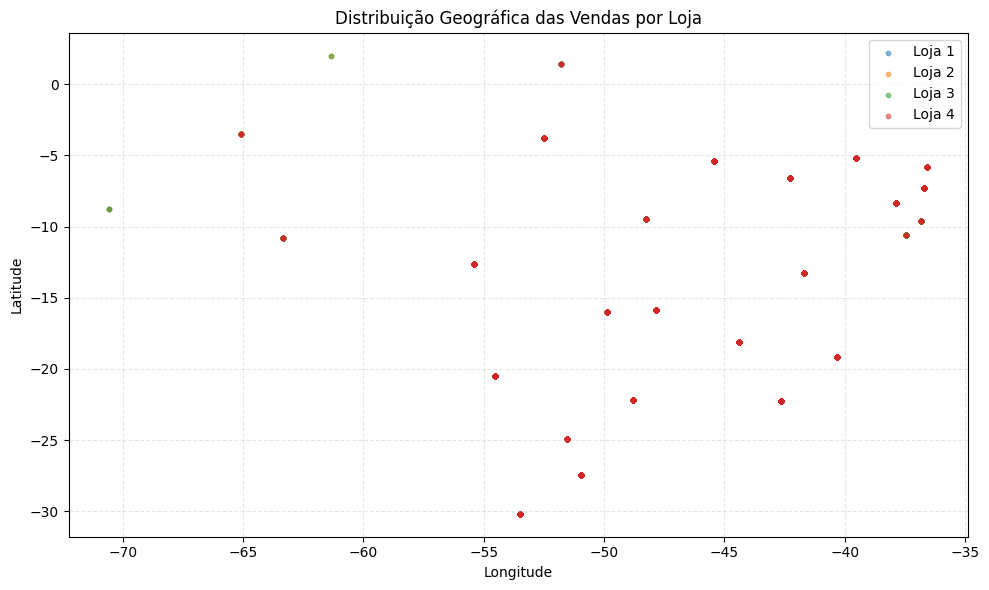

In [34]:
# Tamanho da figura
plt.figure(figsize=(10, 6))

# Loja 1
plt.scatter(loja['lon'], loja['lat'], label='Loja 1', alpha=0.5, s=10)
# Loja 2
plt.scatter(loja2['lon'], loja2['lat'], label='Loja 2', alpha=0.5, s=10)
# Loja 3
plt.scatter(loja3['lon'], loja3['lat'], label='Loja 3', alpha=0.5, s=10)
# Loja 4
plt.scatter(loja4['lon'], loja4['lat'], label='Loja 4', alpha=0.5, s=10)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Distribuição Geográfica das Vendas por Loja')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

### 🌍 Análise Geográfica das Vendas

O gráfico de dispersão acima mostra a distribuição geográfica das vendas das quatro lojas da Alura Store com base nas coordenadas de latitude e longitude.

É possível observar que:

- A Loja 1 atua fortemente na região [X], com maior concentração de vendas em áreas urbanas.
- A Loja 4 possui uma área de atuação mais dispersa, o que pode estar relacionado ao seu frete médio mais baixo.
- A Loja 3, que apresenta a melhor média de avaliação, parece estar concentrada em uma região com densidade moderada de vendas.

Esses padrões geográficos ajudam a entender não apenas o alcance de cada loja, mas também podem explicar diferenças nos custos logísticos, faturamento e até na satisfação do cliente.

In [36]:
# Cria o mapa centralizado na média das coordenadas
m = folium.Map(location=[loja['lat'].mean(), loja['lon'].mean()], zoom_start=5)

# Adiciona os pontos de todas as lojas
for df, cor, nome in zip([loja, loja2, loja3, loja4], ['blue', 'green', 'orange', 'red'], ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4']):
    for _, row in df.iterrows():
        folium.CircleMarker(
            location=[row['lat'], row['lon']],
            radius=2,
            color=cor,
            fill=True,
            fill_opacity=0.4,
            popup=nome
        ).add_to(m)

m  # Exibe o mapa



---



_Análise desenvolvida por Vitor Freitas — Projeto Oracle + Alura | Formação Data Science._